TODO:
- Try blurring vs Autoencoder
- Autoencoder dimension vary
- Line art vs black and white
- Adding/removing tags for dataset and pruning dataset
- Smaller dimensions and more samples


In [2]:
#!pip install torchsummary
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import datasets, models, transforms
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary
from PIL import Image

import urllib.request, urllib.error, urllib.parse
from xml.etree import ElementTree as ET
import os

import cv2

print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)
# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print("Using the GPU!")
else:
    print("WARNING: Could not find GPU! Using CPU only. If you want to enable GPU, please to go Edit > Notebook Settings > Hardware Accelerator and select GPU.")


PyTorch Version:  1.7.0
Torchvision Version:  0.8.1
Using the GPU!


In [3]:
def normal_init(m, mean, std):
    """
    Helper function. Initialize model parameter with given mean and std.
    """
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

In [4]:
SAVE_PATH = './saved_data'
num_files = 1000
n = num_files // 100
def download_data_set():
    if not os.path.exists(SAVE_PATH):
      os.mkdir(SAVE_PATH)

    num_downloaded = 0
    done = False
    i = 0
    while not done:
        scrap_url ="http://safebooru.org/index.php?page=dapi&s=post&q=index&tags=1girl%20solo&pid={0}" 
        response = urllib.request.urlopen(scrap_url.format(i))
        i += 1
        webContent = response.read()
        root = ET.fromstring(webContent.decode('UTF-8'))

        for j, child in enumerate(root):
            file_url = child.attrib['file_url']
            ext = file_url[file_url.rfind('.'):]
            out_name = str(num_downloaded) + '.jpg' # Convert all files to jpg

            img = Image.open(urllib.request.urlopen(file_url))
            try:
              img.save(SAVE_PATH + '/' + out_name)
              num_downloaded += 1
              print("Finished downloading: {0}".format(out_name))
            except Exception as e:
              print(e)
              pass
            if num_downloaded == num_files:
              done = True
              break

    print(root)

if __name__ == '__main__':
    download_data_set()

KeyboardInterrupt: 

In [4]:
# Split up data into train/val/test samples
if not os.path.exists(SAVE_PATH + '/train'):
  os.mkdir(SAVE_PATH + '/train')
os.system('mv ' + SAVE_PATH + '/*.jpg ' + SAVE_PATH + '/train/')


!ls 'saved_data/train'

if not os.path.exists(SAVE_PATH + '/test'):
  os.mkdir(SAVE_PATH + '/test')

if not os.path.exists(SAVE_PATH + '/val'):
  os.mkdir(SAVE_PATH + '/val')


0.jpg
1.jpg
10.jpg
100.jpg
101.jpg
102.jpg
103.jpg
104.jpg
105.jpg
106.jpg
107.jpg
108.jpg
109.jpg
11.jpg
110.jpg
111.jpg
112.jpg
113.jpg
114.jpg
115.jpg
116.jpg
117.jpg
118.jpg
119.jpg
12.jpg
120.jpg
121.jpg
122.jpg
123.jpg
124.jpg
125.jpg
126.jpg
127.jpg
128.jpg
129.jpg
13.jpg
130.jpg
131.jpg
132.jpg
133.jpg
134.jpg
135.jpg
136.jpg
137.jpg
138.jpg
139.jpg
14.jpg
140.jpg
141.jpg
142.jpg
143.jpg
144.jpg
145.jpg
146.jpg
147.jpg
148.jpg
149.jpg
15.jpg
150.jpg
151.jpg
152.jpg
153.jpg
154.jpg
155.jpg
156.jpg
157.jpg
158.jpg
159.jpg
16.jpg
160.jpg
161.jpg
162.jpg
163.jpg
164.jpg
165.jpg
166.jpg
167.jpg
168.jpg
169.jpg
17.jpg
170.jpg
171.jpg
172.jpg
173.jpg
174.jpg
175.jpg
176.jpg
177.jpg
178.jpg
179.jpg
18.jpg
180.jpg
181.jpg
182.jpg
183.jpg
184.jpg
185.jpg
186.jpg
187.jpg
188.jpg
189.jpg
19.jpg
190.jpg
191.jpg
192.jpg
193.jpg
194.jpg
195.jpg
196.jpg
197.jpg
198.jpg
199.jpg
2.jpg
20.jpg
200.jpg
201.jpg
202.jpg
203.jpg
204.jpg
205.jpg
206.jpg
207.jpg
208.jpg
209.jpg
21.jpg
210.jpg
211.jpg
21

(2400, 3200)
(1000, 1000)
(1347, 1920)
(2400, 3600)


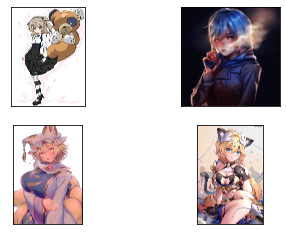

In [5]:
fig, axs = plt.subplots(2, 2)
for i in range(4):
  img = Image.open(SAVE_PATH + "/train/" + str(i) + ".jpg")
  print(img.size)
  axs[i//2, i%2].imshow(img)
  axs[i//2, i%2].get_xaxis().set_visible(False)
  axs[i//2, i%2].get_yaxis().set_visible(False)
plt.show()

In [58]:
def convert_gray_to_rgb(num_files):
    for i in range(num_files):
        img = Image.open(SAVE_PATH + "/train/" + str(i) + ".jpg")
        img = img.convert('RGB')
        img.save(SAVE_PATH + "/train/" + str(i) + ".jpg")
            
        if i % 50 == 0:
            print(i)

In [59]:
convert_gray_to_rgb(num_files)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


In [103]:
import glob 
class IHeartAnimeGirlsDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
          root_dir: the directory of the dataset
          split: "train" or "val"
          transform: pytorch transformations.
        """

        self.transform = transform

        # get the the file path to all train/val images
        # Hint: the function glob.glob is useful
        self.files = glob.glob(root_dir + '/*')
        self.imgs = [Image.open(self.files[idx]) for idx in range(len(self.files))]
        if self.transform:
            for i, img in enumerate(self.imgs):
                self.imgs[i] = self.transform(img)
                if i % 50 == 0:
                    print(i)
            #@self.imgs = [self.transform(img) for img in self.imgs]

    def __len__(self):
      return len(self.files)

    def __getitem__(self, idx):
        return self.imgs[idx]
#         img = Image.open(self.files[idx])
#         if self.transform:
#             img = self.transform(img)
#         return img

batch_size = 4
input_size = (512, 512)
transform = transforms.Compose([
  transforms.Resize(input_size),
  transforms.ToTensor(),
  transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])
train_data = IHeartAnimeGirlsDataset(SAVE_PATH + '/train', transform)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
print('Number of training images {}'.format(len(train_data)))

AUTOENCODER_FEAT_DIM = 24 
enc_batch_size = 200
enc_input_size = (64, 64)
transform = transforms.Compose([
  transforms.Resize(enc_input_size),
  transforms.ToTensor(),
  transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])
enc_train_data = IHeartAnimeGirlsDataset(SAVE_PATH + '/train', transform)
enc_train_loader = DataLoader(enc_train_data, batch_size=enc_batch_size, shuffle=True)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
Number of training images 1000
0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


In [122]:
class Encoder(nn.Module):
    def __init__(self, in_channels=3):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 12, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.Conv2d(12, 24, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.Conv2d(24, 48, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.Conv2d(48, 5, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True)
        )

    def forward(self, x):
        '''
        Given an image x, return the encoded latent representation h.

        Args:
            x: torch.tensor

        Return: 
            h: torch.tensor
        '''
        h = self.encoder(x)
        return h

In [123]:
class Decoder(nn.Module):
    def __init__(self, out_channels=3):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(5, 48, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(48, 24, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(24, 12, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(12, out_channels, kernel_size=(4,4), stride=(2,2), padding=(1,1)),
            nn.Sigmoid(),
        )

    def forward(self, h):
        '''
        Given latent representation h, reconstruct an image patch of size 64 x 64.

        Args:
            h: torch.tensor

        Return: 
            x: torch.tensor
        '''
        x = self.decoder(h)
        return x

In [125]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
summary(encoder, (3, enc_input_size[0], enc_input_size[1]))
summary(decoder, (5, 4, 4))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 32, 32]             588
              ReLU-2           [-1, 12, 32, 32]               0
            Conv2d-3           [-1, 24, 16, 16]           4,632
              ReLU-4           [-1, 24, 16, 16]               0
            Conv2d-5             [-1, 48, 8, 8]          18,480
              ReLU-6             [-1, 48, 8, 8]               0
            Conv2d-7              [-1, 5, 4, 4]           3,845
              ReLU-8              [-1, 5, 4, 4]               0
Total params: 27,545
Trainable params: 27,545
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.05
Forward/backward pass size (MB): 0.33
Params size (MB): 0.11
Estimated Total Size (MB): 0.48
----------------------------------------------------------------
--------------------------------------------

In [126]:
class Autoencoder(nn.Module):
    def __init__(self, in_channels=3, feat_dim=64):
        super(Autoencoder, self).__init__()

        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        '''
        Compress and reconstruct the input image with encoder and decoder.

        Args:
            x: torch.tensor

        Return: 
            x_: torch.tensor
        '''

        h = self.encoder(x)
        x_ = self.decoder(h)

        return x_

In [127]:
def imshow(inp, title=None, ax=None, figsize=(5, 5)):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  if ax is None:
    fig, ax = plt.subplots(1, figsize=figsize)
  ax.imshow(inp)
  ax.set_xticks([])
  ax.set_yticks([])
  if title is not None:
    ax.set_title(title)

def visualize_recon(model, dataloader):
    '''
    Helper function for visualizing reconstruction performance.

    Randomly sample 8 images and plot the original/reconstructed images. 
    '''
    model.eval()
    img = next(iter(dataloader))[:8].to(device)
    out = model(img)
    fig, ax = plt.subplots(1, 1, figsize=(15,10))
    inp = torchvision.utils.make_grid(torch.cat((img, out), dim=2), nrow=8)
    imshow(inp.detach().cpu(), ax=ax)
    model.train()
    plt.show()

In [128]:
from tqdm import tqdm_notebook

def train_ae(model, dataloader, epochs=200):
    '''
    Train autoencoder model.

    Args:
        model: torch.nn.module.
        dataloader: DataLoader. The unlabeled partition of the STL dataset.
    '''

    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.MSELoss()
    loss_traj = []

    for epoch in tqdm_notebook(range(epochs)):
        loss_epoch = 0

        for x in dataloader:
            optimizer.zero_grad()
            x_dev = x.to(device)
            y = model(x_dev)
            start = time.time()
            loss = criterion(y, x_dev)
            loss.backward()
            optimizer.step()

            loss_epoch += loss.detach()
            start = time.time()

        if epoch % 10 == 9:
            print('Epoch {}, loss {:.3f}'.format(epoch, loss_epoch))
            visualize_recon(model, dataloader)
        loss_traj.append(loss_epoch)

    return model, loss_traj

<ipython-input-128-895461d3e046>:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(epochs)):


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9, loss 1.120


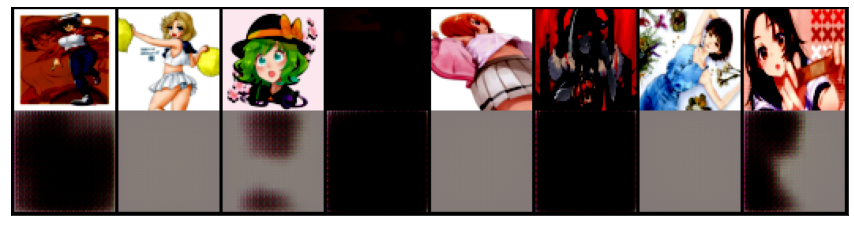

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 19, loss 0.830


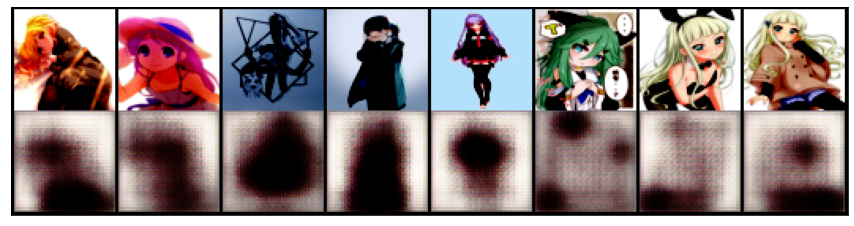

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 29, loss 0.740


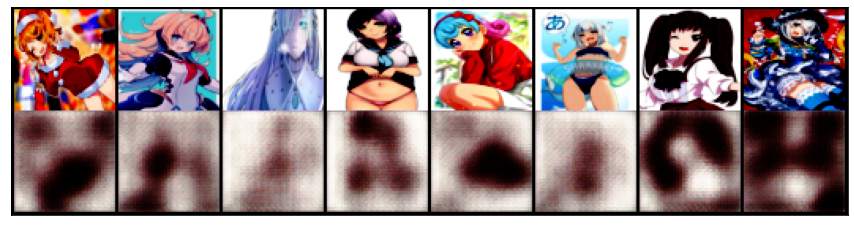

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 39, loss 0.680


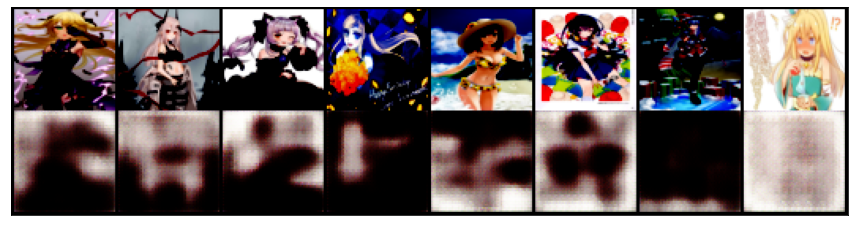

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 49, loss 0.655


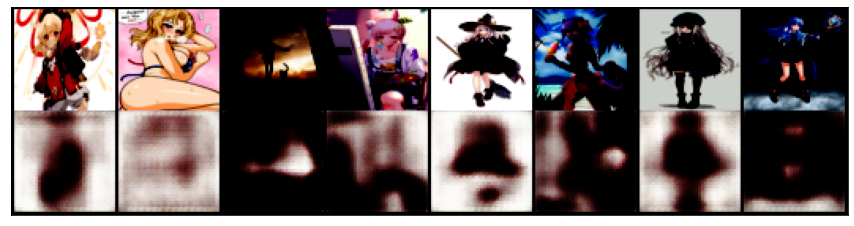

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 59, loss 0.640


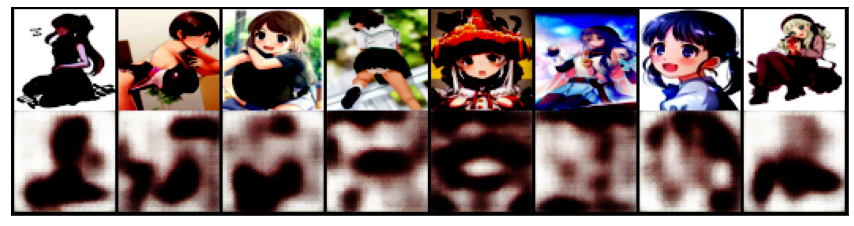

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 69, loss 0.631


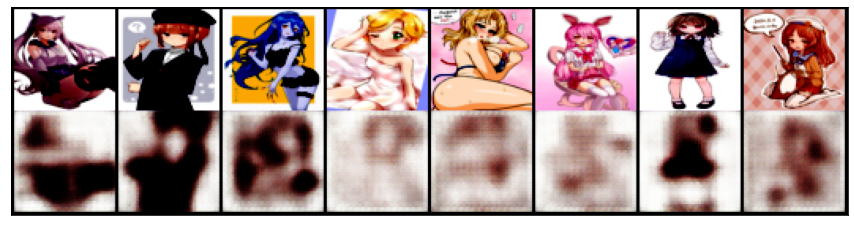

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 79, loss 0.622


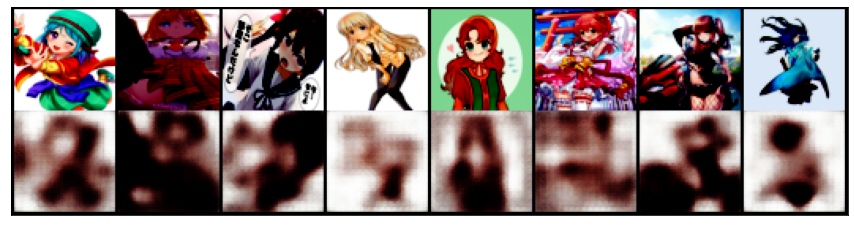

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 89, loss 0.620


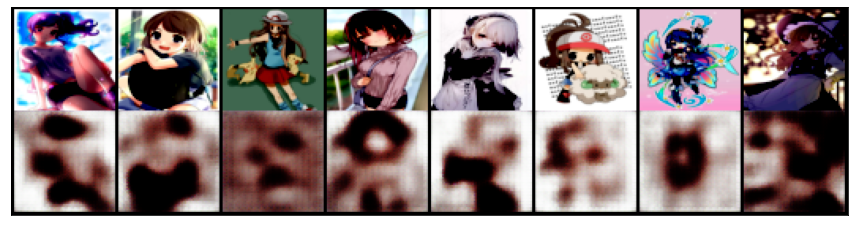

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 99, loss 0.606


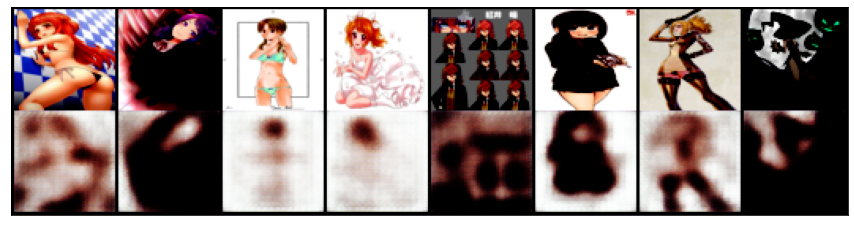

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 109, loss 0.602


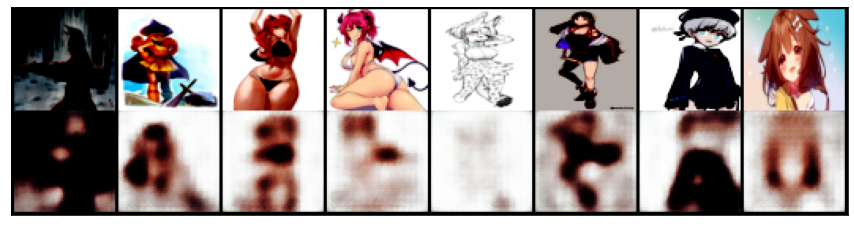

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 119, loss 0.594


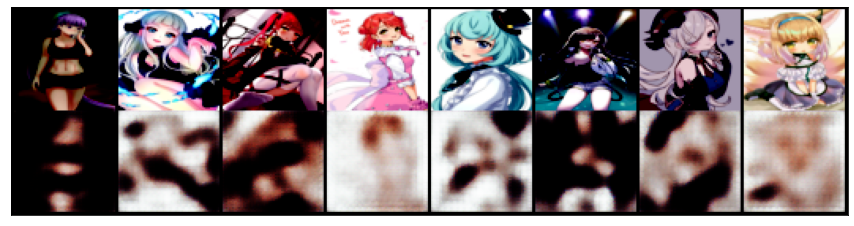

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 129, loss 0.588


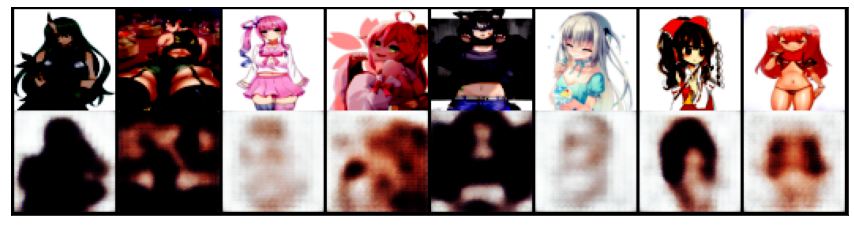

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 139, loss 0.582


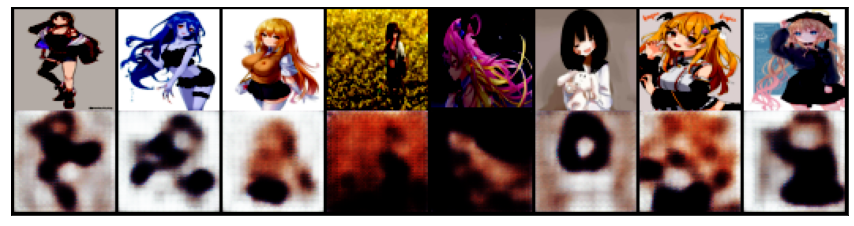

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 149, loss 0.577


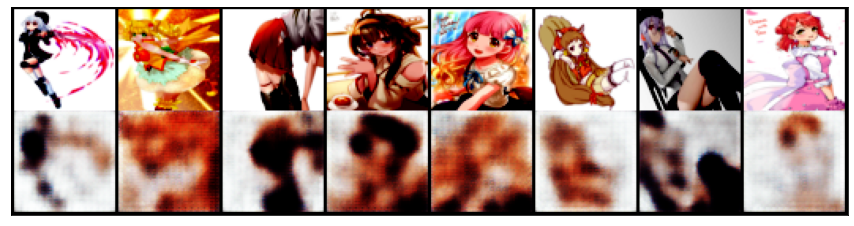

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 159, loss 0.570


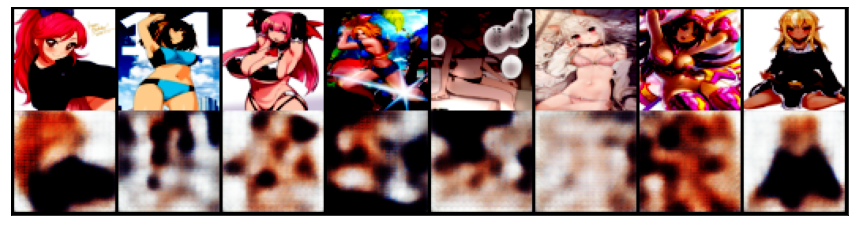

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 169, loss 0.563


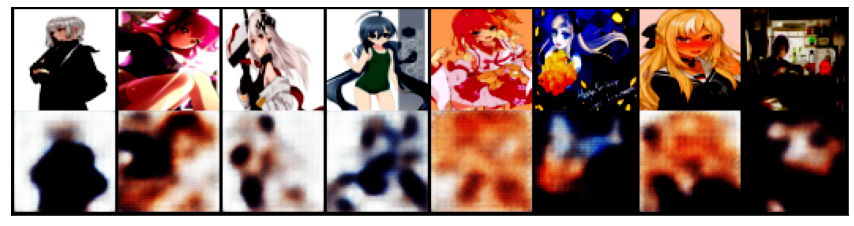

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 179, loss 0.560


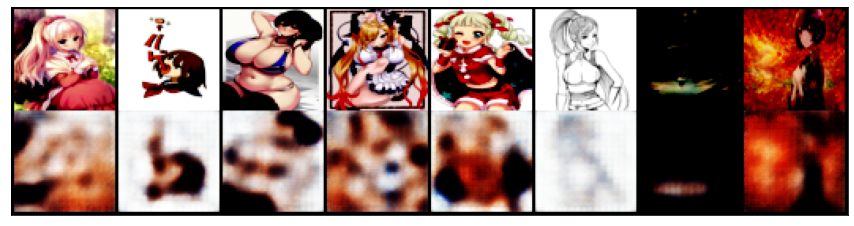

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 189, loss 0.555


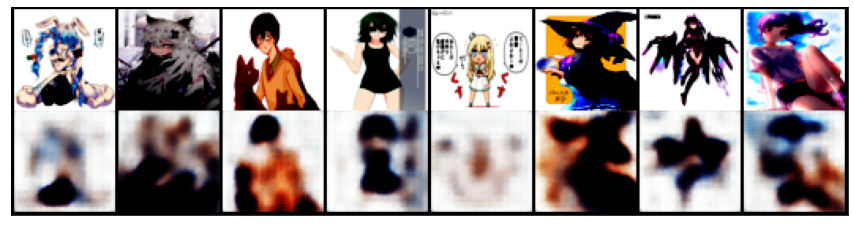

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 199, loss 0.554


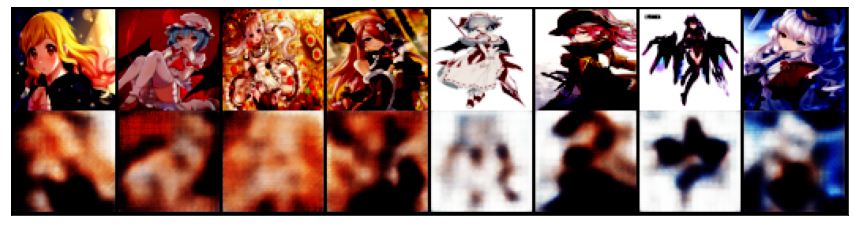

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 209, loss 0.551


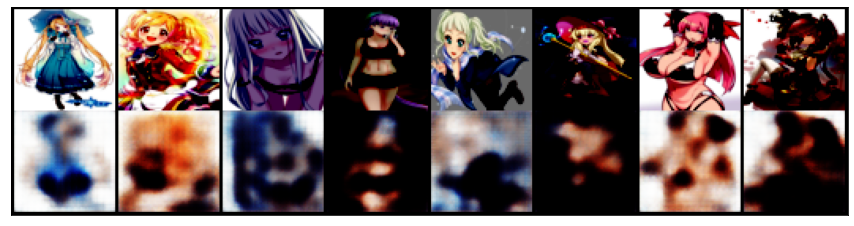

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 219, loss 0.553


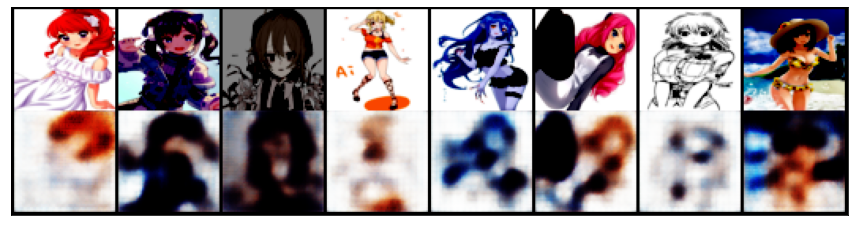

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 229, loss 0.547


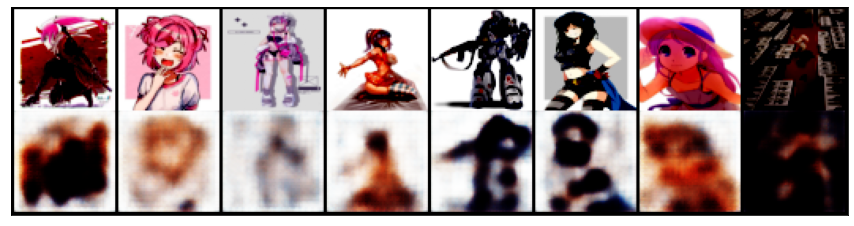

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 239, loss 0.546


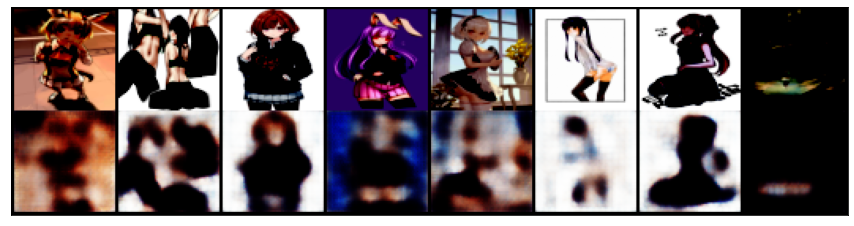

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 249, loss 0.545


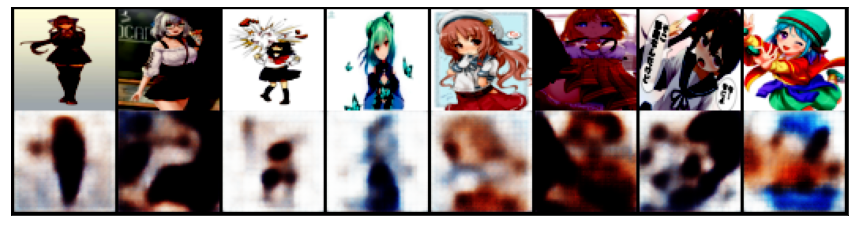

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 259, loss 0.543


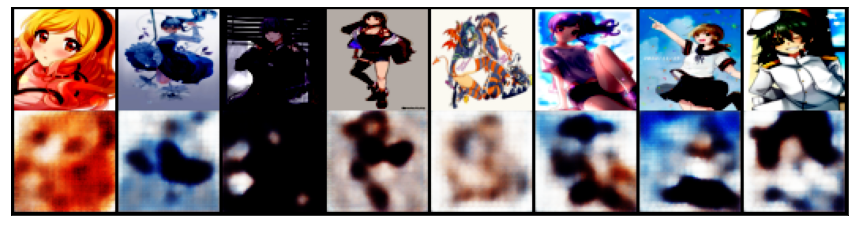

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 269, loss 0.544


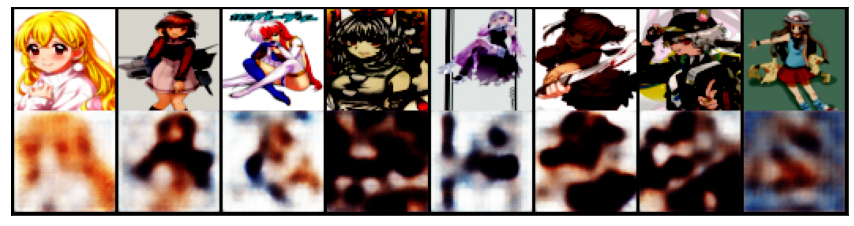

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 279, loss 0.542


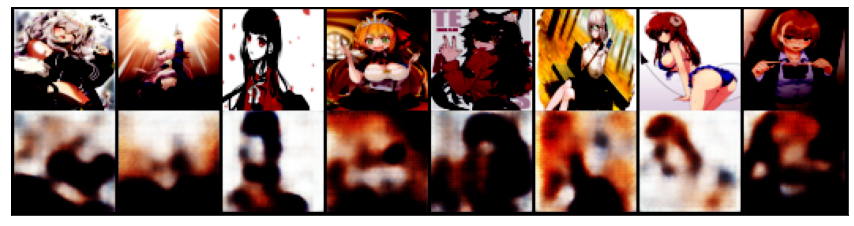

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 289, loss 0.540


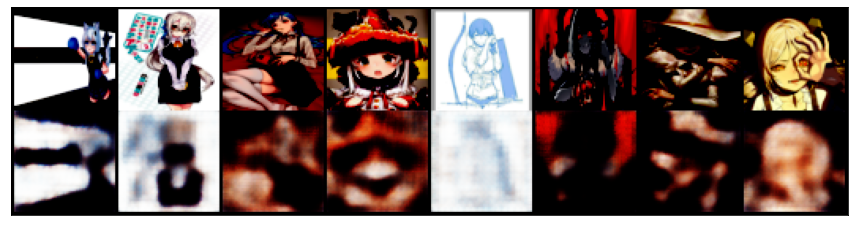

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 299, loss 0.540


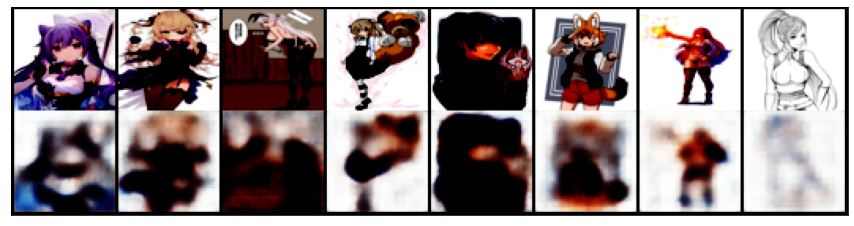

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 309, loss 0.539


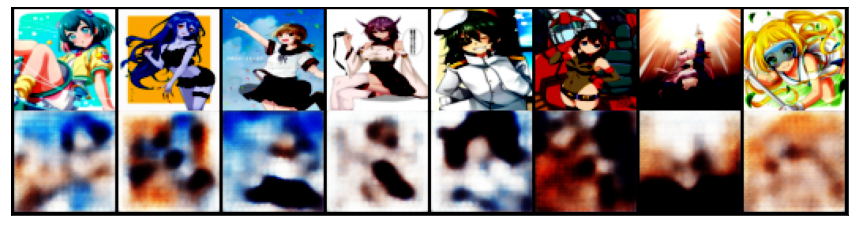

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 319, loss 0.538


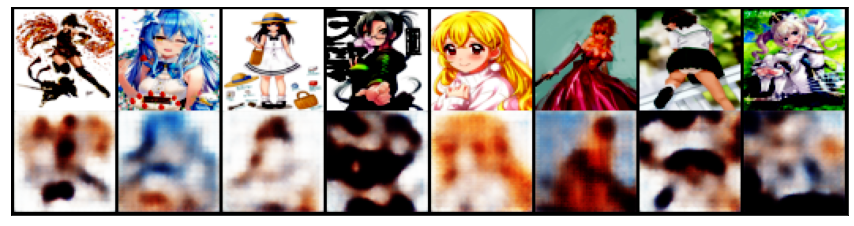

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 329, loss 0.538


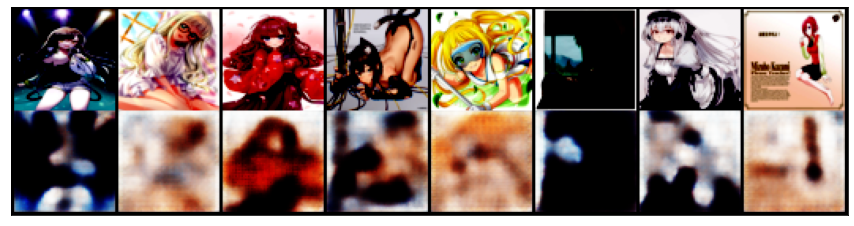

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 339, loss 0.537


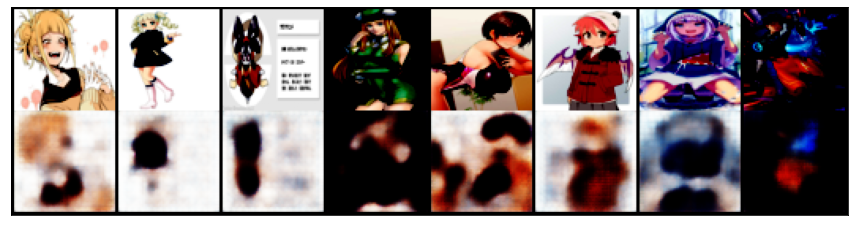

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 349, loss 0.536


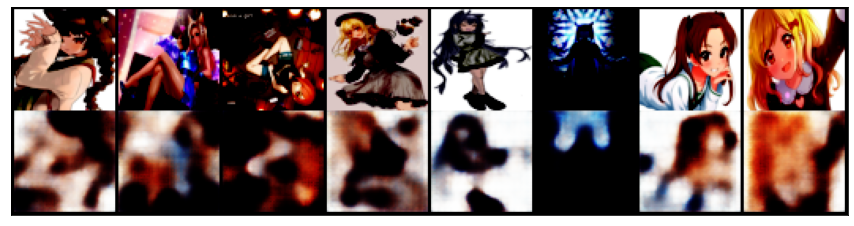

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 359, loss 0.535


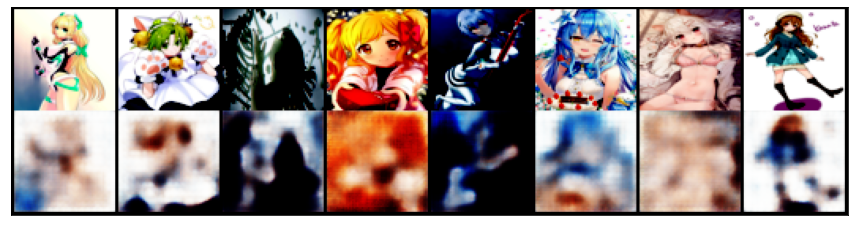

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 369, loss 0.536


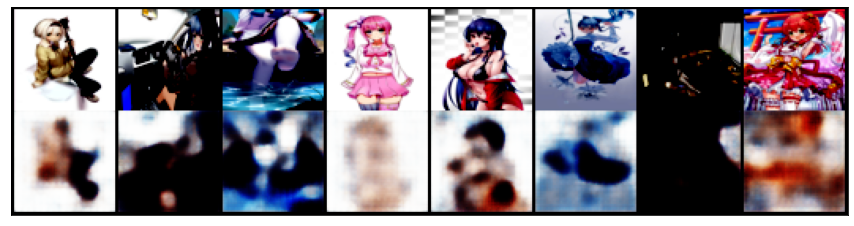

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 379, loss 0.533


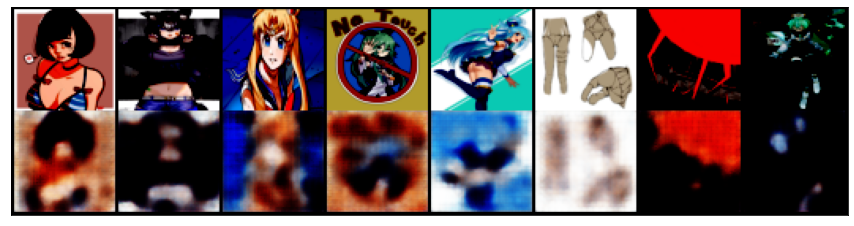

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 389, loss 0.534


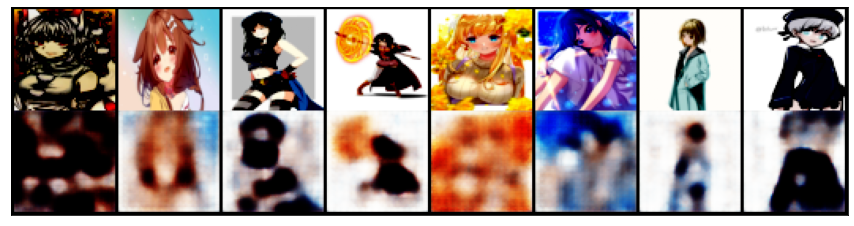

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 399, loss 0.532


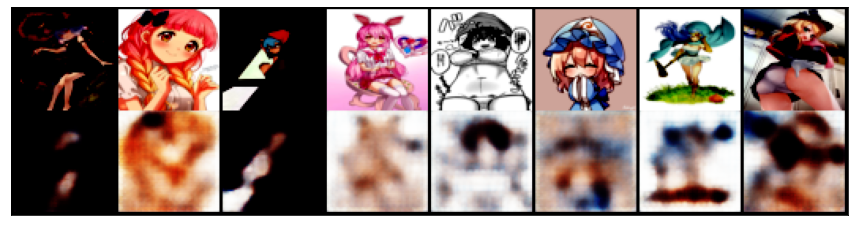

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 409, loss 0.532


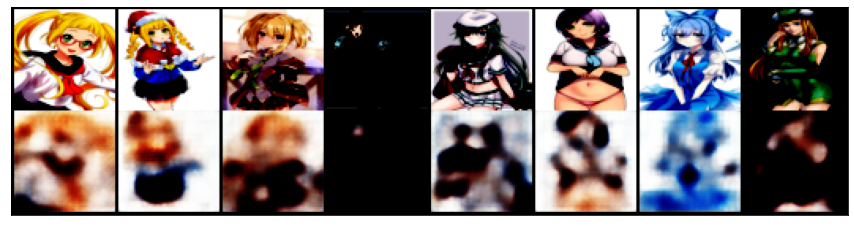

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 419, loss 0.532


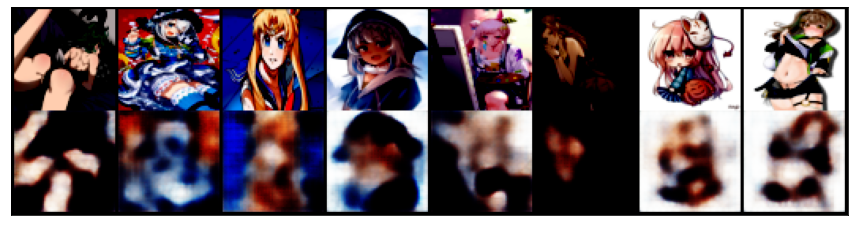

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 429, loss 0.531


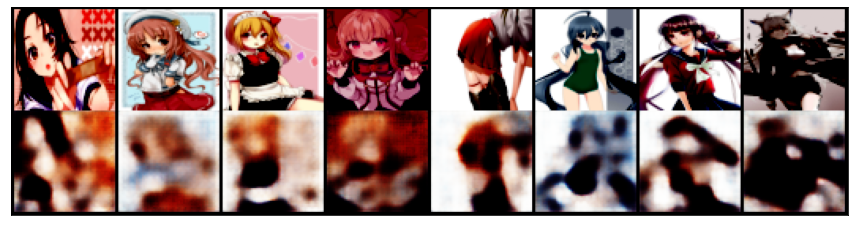

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 439, loss 0.533


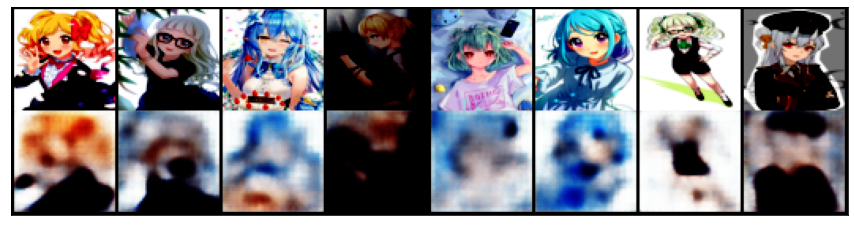

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 449, loss 0.529


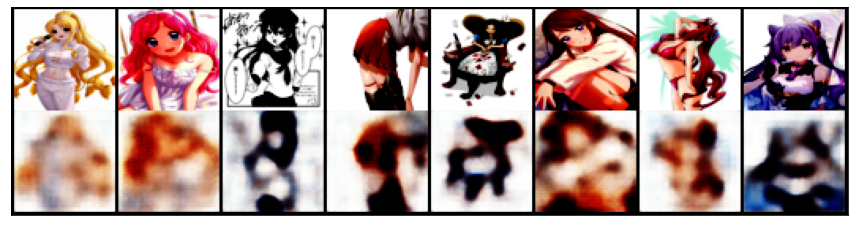

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 459, loss 0.529


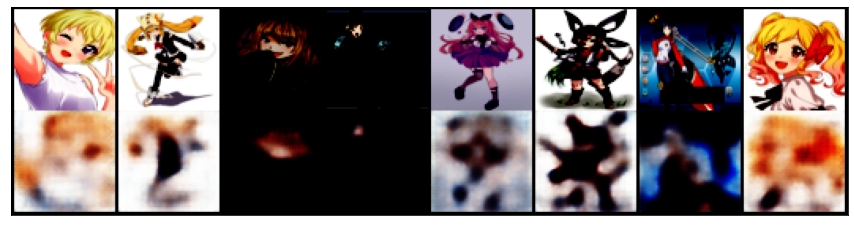

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 469, loss 0.529


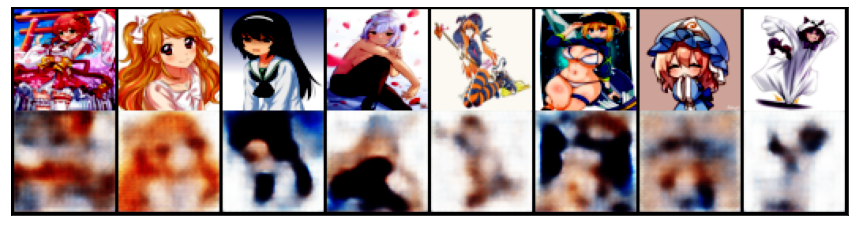

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 479, loss 0.530


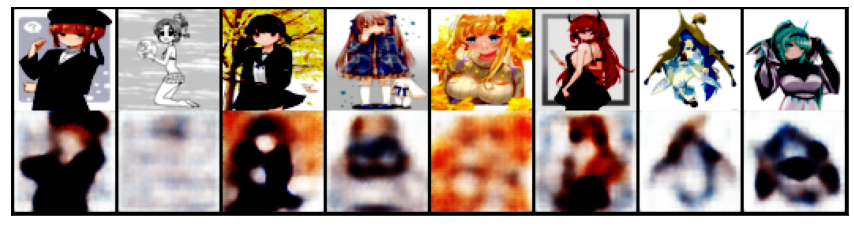

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 489, loss 0.528


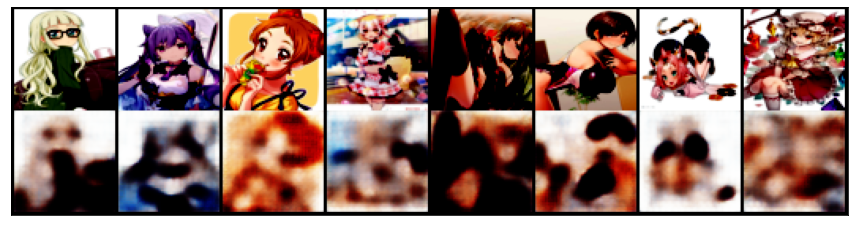

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 499, loss 0.529


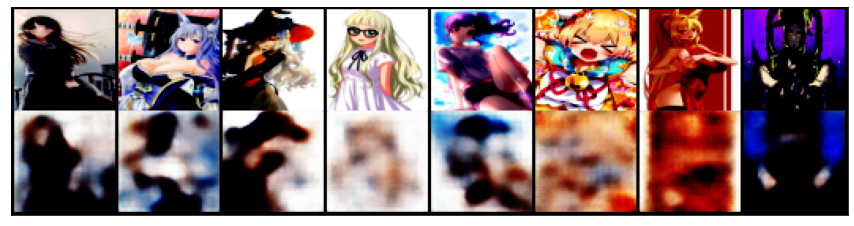

In [129]:
ae = Autoencoder().to(device)
ae, ae_loss_traj = train_ae(ae, enc_train_loader, epochs=500)
torch.save(ae.state_dict(), 'ae.pth')

In [130]:
class Generator(nn.Module):
    # initializers
    def __init__(self):
        super(Generator, self).__init__()
		
        self.add_module("conv1", nn.Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv2", nn.Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv2_bn", nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv3", nn.Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv3_bn", nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv4", nn.Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv4_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv5", nn.Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv5_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv6", nn.Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv6_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv7", nn.Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv7_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv8", nn.Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv1", nn.ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv1_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv2", nn.ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv2_bn", nn.BatchNorm2d (512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv3", nn.ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv3_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv4", nn.ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv4_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv5", nn.ConvTranspose2d(1024, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv5_bn", nn.BatchNorm2d (256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv6", nn.ConvTranspose2d(512, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv6_bn", nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv7", nn.ConvTranspose2d (256, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("deconv7_bn", nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("deconv8", nn.ConvTranspose2d (128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        o = input
        o = self._modules["conv1"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o1 = o 

        o = self._modules["conv2"](o)
        o = self._modules["conv2_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o2 = o

        o = self._modules["conv3"](o)
        o = self._modules["conv3_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o3 = o

        o = self._modules["conv4"](o)
        o = self._modules["conv4_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o4 = o

        o = self._modules["conv5"](o)
        o = self._modules["conv5_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o5 = o

        o = self._modules["conv6"](o)
        o = self._modules["conv6_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o6 = o

        o = self._modules["conv7"](o)
        o = self._modules["conv7_bn"](o)
        o = nn.functional.leaky_relu(o, 0.2, inplace=True)
        o7 = o

        o = self._modules["conv8"](o)
        o = self._modules["deconv1"](o)
        o = self._modules["deconv1_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv2"](torch.cat([o7, o], 1))
        o = self._modules["deconv2_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv3"](torch.cat([o6, o], 1))
        o = self._modules["deconv3_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv4"](torch.cat([o5, o], 1))
        o = self._modules["deconv4_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv5"](torch.cat([o4, o], 1))
        o = self._modules["deconv5_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv6"](torch.cat([o3, o], 1))
        o = self._modules["deconv6_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv7"](torch.cat([o2, o], 1))
        o = self._modules["deconv7_bn"](o)
        o = nn.functional.relu(o, inplace=True)

        o = self._modules["deconv8"](torch.cat([o1, o], 1))

        return o

class Discriminator(nn.Module):
    # initializers
    def __init__(self):
        super(Discriminator, self).__init__()
        self.add_module("conv1", nn.Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv2", nn.Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv2_bn", nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv3", nn.Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv3_bn", nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv4", nn.Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))
        self.add_module("conv4_bn", nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        self.add_module("conv5", nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)))

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        x = input
        x = self._modules["conv1"](x)
        x = nn.functional.leaky_relu(x, 0.2, inplace=True)

        x = self._modules["conv2"](x)
        x = self._modules["conv2_bn"](x)
        x = nn.functional.leaky_relu(x, 0.2, inplace=True)

        x = self._modules["conv3"](x)
        x = self._modules["conv3_bn"](x)
        x = nn.functional.leaky_relu(x, 0.2, inplace=True)

        x = self._modules["conv4"](x)
        x = self._modules["conv4_bn"](x)
        x = nn.functional.leaky_relu(x, 0.2, inplace=True)

        x = self._modules["conv5"](x)
        x = nn.functional.sigmoid(x)

        return x

In [132]:
G = Generator().cuda()
D = Discriminator().cuda()
summary(G, (3, 256, 256))
summary(D, (6, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
            Conv2d-2          [-1, 128, 64, 64]         131,200
       BatchNorm2d-3          [-1, 128, 64, 64]             256
            Conv2d-4          [-1, 256, 32, 32]         524,544
       BatchNorm2d-5          [-1, 256, 32, 32]             512
            Conv2d-6          [-1, 512, 16, 16]       2,097,664
       BatchNorm2d-7          [-1, 512, 16, 16]           1,024
            Conv2d-8            [-1, 512, 8, 8]       4,194,816
       BatchNorm2d-9            [-1, 512, 8, 8]           1,024
           Conv2d-10            [-1, 512, 4, 4]       4,194,816
      BatchNorm2d-11            [-1, 512, 4, 4]           1,024
           Conv2d-12            [-1, 512, 2, 2]       4,194,816
      BatchNorm2d-13            [-1, 512, 2, 2]           1,024
           Conv2d-14            [-1, 51

C:\Users\james hazelden\anaconda3\lib\site-packages\torch\nn\functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
